## MobileNetV2 Label Training

Using a conda env with tf 2.9.0

In [15]:
# Clone the tensorflow models repository from GitHub
!pip uninstall Cython -y # Temporary fix for "No module named 'object_detection'" error
!pip install -q roboflow
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4401, done.
remote: Counting objects: 100% (4401/4401), done.
remote: Compressing objects: 100% (3220/3220), done.
remote: Total 4401 (delta 1187), reused 3079 (delta 1105), pack-reused 0 (from 0)
Receiving objects: 100% (4401/4401), 70.05 MiB | 809.00 KiB/s, done.
Resolving deltas: 100% (1187/1187), done.


In [17]:
# Copy setup files into models/research folder

%cd models/research/
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .

/home/manu/chamba/training/models/research


In [31]:
# Modify setup.py file to install the tf-models-official repository targeted at TF v2.8.0
import re
with open('/home/manu/chamba/training/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/home/manu/chamba/training/models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    #s = re.sub('tf-models-official>=2.5.1',
    #           'tf-models-official==2.9.1', s)
    s = re.sub('tf-models-official>=2.5.1',
               '', s)
    
    f.write(s)

In [33]:
%cd /home/manu/chamba/training

#!git clone --depth 1 https://github.com/tensorflow/models
%cd models/research/
!pip uninstall Cython -y
!protoc object_detection/protos/*.proto --python_out=.
#!pip install setuptools==59.8.0
!pip install numpy==1.21.6 --upgrade
!pip install tf-models-official==2.9.1 --no-deps  # Install without deps to avoid PyYAML build
!python -m pip install .
# tf-models-official==2.9.1

/home/manu/chamba/training
/home/manu/chamba/training/models/research
Found existing installation: Cython 3.2.4
Uninstalling Cython-3.2.4:
  Successfully uninstalled Cython-3.2.4
  Using cached numpy-1.21.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.1 kB)
Using cached numpy-1.21.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (15.9 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lvis 0.5.3 requires Cython>=0.29.12, which is not installed.
object-detection 0.1 requires Cython, which is not installed.
tf-models-official 2.9.1 requires Cython, which is not installed.
tf-models-official 2.9.1 requires tensorflow-addons, which is not installed.
ai-edge-litert 2.1.0 requires nu

In [36]:
!pip install scikit-learn==1.3.0
!pip install scipy==1.9.0
!pip install tensorflow-model-optimization==0.7.5

  Using cached numpy-2.2.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 10.4 MB/s  0:00:01 eta 0:00:0136m0:00:01
Using cached numpy-2.2.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
  Attempting uninstall: scikit-learn━━━━━━━━━━━━━━━━━━ 0/2 [numpy]
    Found existing installation: scikit-learn 1.7.2 0/2 [numpy]
    Uninstalling scikit-learn-1.7.2:━━━━━━━━━━━━━━ 0/2 [numpy]
      Successfully uninstalled scikit-learn-1.7.2━ 0/2 [numpy]
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [scikit-learn]0m 1/2 [scikit-learn]
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-models-official 2.9.1 requires tens

In [52]:
!pip install tensorflow==2.9.0 --upgrade
!pip install tensorflow-addons==0.17.1
!pip install protobuf==3.20.3

  Using cached protobuf-3.19.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (787 bytes)
Using cached protobuf-3.19.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (1.1 MB)
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-models-official 2.9.1 requires tensorflow-addons, which is not installed.
apache-beam 2.70.0 requires protobuf!=4.0.*,!=4.21.*,!=4.22.0,!=4.23.*,!=4.24.*,<7.0.0.dev0,>=3.20.3, but you have protobuf 3.19.6 which is incompatible.
googleapis-common-protos 1.72.0 requires protobuf!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<7.0.0,>=3.20.2, but you have protobuf 3.19.6 which is incompatible.
tensorflow-datasets 4.9.9 requires protobuf>=3.20, but you h

In [41]:
!pwd
!python object_detection/builders/model_builder_tf2_test.py

/home/manu/chamba/training/models/research
2026-01-10 01:18:18.641383: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-10 01:18:18.644531: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2026-01-10 01:18:18.644550: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
/home/manu/miniconda3/envs/tf2_9/lib/python3.10/site-packages/google/api_core/_python_version_support.py:275: FutureWarning: You are using a Python version (3.10.19) which Google will stop supporting in new releases of google.api_core once it reaches its end of life (2026-10

## Prepare dataset

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="LHiJvoAFmvmbSi50SwC1")
project = rf.workspace("hvac-whaik").project("ai-hvac-nameplate-focus-kcnb5")
version = project.version(12)
dataset = version.download("tensorflow")

In [42]:
import os
import pandas as pd
import tensorflow as tf
from object_detection.utils import dataset_util
from PIL import Image
import io

2026-01-10 01:18:44.982072: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-10 01:18:44.985509: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2026-01-10 01:18:44.985519: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
/home/manu/miniconda3/envs/tf2_9/lib/python3.10/site-packages/google/api_core/_python_version_support.py:275: FutureWarning: You are using a Python version (3.10.19) which Google will stop supporting in new releases of google.api_core once it reaches its end of life (2026-10-04). Please upgrade to the latest Python v

In [43]:
# Cell 4: Define label map (classes)
# Assuming you have a classes.txt or similar; adjust based on your dataset

#DATASET_DIR = dataset.location # Replace with your local dataset path
DATASET_DIR = "/home/manu/chamba/training/ai-hvac-nameplate-focus-12"
TRAIN_DIR = os.path.join(DATASET_DIR, 'train')
TEST_DIR = os.path.join(DATASET_DIR, 'test')
VALID_DIR = os.path.join(DATASET_DIR, 'valid')

label_map = {
    1: 'HVAC_Spec_Label'
}

def create_label_map_file(label_map, output_path):
    with open(output_path, 'w') as f:
        for id, name in label_map.items():
            f.write(f'item {{\n  id: {id}\n  name: "{name}"\n}}\n')

LABEL_MAP_PATH = os.path.join(DATASET_DIR, 'label_map.pbtxt')
create_label_map_file(label_map, LABEL_MAP_PATH)

In [44]:
# Cell 5: Function to parse CSV and create TFRecord
def create_tf_example(row, image_dir):
    filename = row['filename']  # Assuming CSV has 'filename' column
    img_path = os.path.join(image_dir, filename)
    with tf.io.gfile.GFile(img_path, 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = filename.encode('utf8')
    image_format = b'jpg'
    xmins = [row['xmin'] / width]  # Assuming normalized or adjust if not
    xmaxs = [row['xmax'] / width]
    ymins = [row['ymin'] / height]
    ymaxs = [row['ymax'] / height]
    classes_text = [row['class'].encode('utf8')]  # Assuming 'class' column
    classes = [list(label_map.keys())[list(label_map.values()).index(row['class'])]]  # Map class name to id

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example

def csv_to_tfrecord(csv_path, image_dir, output_path):
    writer = tf.io.TFRecordWriter(output_path)
    df = pd.read_csv(csv_path)
    for _, row in df.iterrows():
        tf_example = create_tf_example(row, image_dir)
        writer.write(tf_example.SerializeToString())
    writer.close()

In [45]:
# Cell 6: Create TFRecords for train, test, valid
TRAIN_CSV = os.path.join(TRAIN_DIR, '_annotations.csv')
TEST_CSV = os.path.join(TEST_DIR, '_annotations.csv')
VALID_CSV = os.path.join(VALID_DIR, '_annotations.csv')

TRAIN_TFRECORD = os.path.join(DATASET_DIR, 'train.tfrecord')
TEST_TFRECORD = os.path.join(DATASET_DIR, 'test.tfrecord')
VALID_TFRECORD = os.path.join(DATASET_DIR, 'valid.tfrecord')

csv_to_tfrecord(TRAIN_CSV, TRAIN_DIR, TRAIN_TFRECORD)
csv_to_tfrecord(TEST_CSV, TEST_DIR, TEST_TFRECORD)
csv_to_tfrecord(VALID_CSV, VALID_DIR, VALID_TFRECORD)

In [46]:
# Cell 7: Download pre-trained model (e.g., SSD MobileNet)
# Assuming using TensorFlow Object Detection API

MODEL_DIR = '/home/manu/chamba/training/my_models'  # Set your model directory
MODEL_NAME = 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8'
MODEL_URL = f'http://download.tensorflow.org/models/object_detection/tf2/20200711/{MODEL_NAME}.tar.gz'

!wget {MODEL_URL}
!tar -xf {MODEL_NAME}.tar.gz -C {MODEL_DIR}

--2026-01-10 01:19:14--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 64.233.186.207, 64.233.190.207, 172.217.192.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|64.233.186.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  7.43MB/s    in 2.6s    

2026-01-10 01:19:17 (7.43 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]



In [47]:
# Cell 7.5: Define PIPELINE_CONFIG_PATH
# Add this cell after Cell 7 and before Cell 8.5

PIPELINE_CONFIG_PATH = os.path.join(MODEL_DIR, MODEL_NAME, 'pipeline.config')

In [48]:
# Cell 8.5: Modify pipeline.config with actual paths
# Insert this cell after Cell 8 and before Cell 9

import re

# Read the pipeline config
with open(PIPELINE_CONFIG_PATH, 'r') as f:
    config = f.read()

# Define replacements
replacements = {
    'num_classes: 90': 'num_classes: 1',  # Assuming 1 class
    'PATH_TO_BE_CONFIGURED/train.tfrecord': TRAIN_TFRECORD,
    'PATH_TO_BE_CONFIGURED/val.tfrecord': VALID_TFRECORD,
    'PATH_TO_BE_CONFIGURED/label_map.pbtxt': LABEL_MAP_PATH,
    'PATH_TO_BE_CONFIGURED/model.ckpt': os.path.join(MODEL_DIR, MODEL_NAME, 'checkpoint', 'ckpt-0'),  # Adjust if needed
}

# Apply replacements
for placeholder, actual in replacements.items():
    config = config.replace(placeholder, actual)

# Write back
with open(PIPELINE_CONFIG_PATH, 'w') as f:
    f.write(config)

print("Pipeline config updated.")

Pipeline config updated.


In [49]:
# Cell 8.5: Modify pipeline.config with actual paths
# Insert this cell after Cell 8 and before Cell 9

import re

# Read the pipeline config
with open(PIPELINE_CONFIG_PATH, 'r') as f:
    config = f.read()

# Print original config lines with placeholders for debugging
print("Original config lines containing 'PATH_TO_BE_CONFIGURED':")
for line in config.split('\n'):
    if 'PATH_TO_BE_CONFIGURED' in line:
        print(line)

# Define actual paths
checkpoint_path = os.path.join(MODEL_DIR, MODEL_NAME, 'checkpoint', 'ckpt-0').replace('\\', '/')
train_tfrecord_path = TRAIN_TFRECORD.replace('\\', '/')
val_tfrecord_path = VALID_TFRECORD.replace('\\', '/')
label_map_path = LABEL_MAP_PATH.replace('\\', '/')

# Replace fine_tune_checkpoint with empty string to avoid checkpoint mismatch
config = re.sub(r'fine_tune_checkpoint: "PATH_TO_BE_CONFIGURED"', 'fine_tune_checkpoint: ""', config)

# Replace first label_map_path (train)
config = re.sub(r'label_map_path: "PATH_TO_BE_CONFIGURED"', f'label_map_path: "{label_map_path}"', config, count=1)

# Replace first input_path (train)
config = re.sub(r'input_path: "PATH_TO_BE_CONFIGURED"', f'input_path: "{train_tfrecord_path}"', config, count=1)

# Replace second label_map_path (eval)
config = re.sub(r'label_map_path: "PATH_TO_BE_CONFIGURED"', f'label_map_path: "{label_map_path}"', config, count=1)

# Replace second input_path (eval)
config = re.sub(r'input_path: "PATH_TO_BE_CONFIGURED"', f'input_path: "{val_tfrecord_path}"', config, count=1)

# Also replace num_classes
config = config.replace('num_classes: 90', 'num_classes: 1')

# Write back
with open(PIPELINE_CONFIG_PATH, 'w') as f:
    f.write(config)

print("Pipeline config updated.")
print("Updated config lines containing 'PATH_TO_BE_CONFIGURED' (should be none):")
for line in config.split('\n'):
    if 'PATH_TO_BE_CONFIGURED' in line:
        print(line)

Original config lines containing 'PATH_TO_BE_CONFIGURED':
  fine_tune_checkpoint: "PATH_TO_BE_CONFIGURED"
  label_map_path: "PATH_TO_BE_CONFIGURED"
    input_path: "PATH_TO_BE_CONFIGURED"
  label_map_path: "PATH_TO_BE_CONFIGURED"
    input_path: "PATH_TO_BE_CONFIGURED"
Pipeline config updated.
Updated config lines containing 'PATH_TO_BE_CONFIGURED' (should be none):


## Training

Note here that the training was initally set to 50000 steps, but according to the logs we've sttoped it at 20000 cause it was running by 8 hours. You can resume the training process with same command if you have the checkpoints in the directory. Just make sure to backup the generated files in training to avoid any missassociation between files per training

In [ ]:
# Cell 9: Train the model
%cd /home/manu/chamba/training

# Assuming you have the Object Detection API installed
!python /home/manu/chamba/training/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={PIPELINE_CONFIG_PATH} \
    --model_dir={MODEL_DIR}/trained_model \
    --alsologtostderr \
    --num_train_steps=15000 \
    --sample_1_of_n_eval_examples=1 \
    2> training_logs.txt

/home/manu/chamba/training
^C


## Convert to TFlite

In [55]:
# Cell 10: Export and Convert to TFLite
# Adapted from your Colab code to fit this notebook's paths

import os

# Define paths (adjust if needed)
MODEL_DIR = '/home/manu/chamba/training/my_models'
TRAINED_MODEL_DIR = os.path.join(MODEL_DIR, 'trained_model')
OUTPUT_DIR = os.path.join(MODEL_DIR, 'exported_model')
PIPELINE_CONFIG_PATH = os.path.join(MODEL_DIR, 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8', 'pipeline.config')
TFLITE_MODEL_PATH = os.path.join(MODEL_DIR, 'model.tflite')

# Create output directory if it doesn't exist
!mkdir -p {OUTPUT_DIR}

# Export the graph
!python /home/manu/chamba/training/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {TRAINED_MODEL_DIR} \
    --output_directory {OUTPUT_DIR} \
    --pipeline_config_path {PIPELINE_CONFIG_PATH}

# Convert to TFLite
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model(os.path.join(OUTPUT_DIR, 'saved_model'))
tflite_model = converter.convert()

with open(TFLITE_MODEL_PATH, 'wb') as f:
    f.write(tflite_model)

print(f"TFLite model saved to: {TFLITE_MODEL_PATH}")

2026-01-10 10:02:06.239587: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-10 10:02:06.242811: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2026-01-10 10:02:06.242827: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
/home/manu/miniconda3/envs/tf2_9/lib/python3.10/site-packages/google/api_core/_python_version_support.py:275: FutureWarning: You are using a Python version (3.10.19) which Google will stop supporting in new releases of google.api_core once it reaches its end of life (2026-10-04). Please upgrade to the latest Python v

2026-01-10 10:02:30.742433: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2026-01-10 10:02:30.745196: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2026-01-10 10:02:30.745252: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory
2026-01-10 10:02:30.745275: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory
2026-01-10 10:02:30.745301: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Co

Estimated count of arithmetic ops: 1.698 G  ops, equivalently 0.849 G  MACs
TFLite model saved to: /home/manu/chamba/training/my_models/model.tflite


2026-01-10 10:02:38.019658: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:362] Ignored output_format.
2026-01-10 10:02:38.019685: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:365] Ignored drop_control_dependency.
2026-01-10 10:02:38.020554: I tensorflow/cc/saved_model/reader.cc:43] Reading SavedModel from: /home/manu/chamba/training/my_models/exported_model/saved_model
2026-01-10 10:02:38.061647: I tensorflow/cc/saved_model/reader.cc:81] Reading meta graph with tags { serve }
2026-01-10 10:02:38.061686: I tensorflow/cc/saved_model/reader.cc:122] Reading SavedModel debug info (if present) from: /home/manu/chamba/training/my_models/exported_model/saved_model
2026-01-10 10:02:38.172555: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:354] MLIR V1 optimization pass is not enabled
2026-01-10 10:02:38.216243: I tensorflow/cc/saved_model/loader.cc:228] Restoring SavedModel bundle.
2026-01-10 10:02:38.818520: I tensorflow/cc/saved_model/l

In [56]:
import tensorflow as tf
interpreter = tf.lite.Interpreter('/home/manu/chamba/training/my_models/model.tflite')
interpreter.allocate_tensors()
print('Input:', interpreter.get_input_details())
print('Output:', interpreter.get_output_details())

Input: [{'name': 'serving_default_input:0', 'index': 0, 'shape': array([  1, 320, 320,   3], dtype=int32), 'shape_signature': array([  1, 320, 320,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]
Output: [{'name': 'StatefulPartitionedCall:1', 'index': 339, 'shape': array([ 1, 10], dtype=int32), 'shape_signature': array([ 1, 10], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}, {'name': 'StatefulPartitionedCall:3', 'index': 337, 'shape': array([ 1, 10,  4], dtype=int32), 'shape_signature': array([ 1, 10,  4], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': a

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


## Test TensorFlow Lite Model and Calculate mAP

In [12]:
# Cell 11: Test TensorFlow Lite Model and Calculate mAP
# Adapted from the provided code to fit this notebook's paths and dataset

import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
matplotlib.use('Agg')  # Set non-interactive backend to avoid GUI issues in VS Code
import matplotlib.pyplot as plt

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/home/manu/chamba/training/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory (adapted for .pbtxt or create list)
  # Since label_map.pbtxt has 'item { id: 1 name: "HVAC_Spec_Label" }', we'll hardcode for simplicity
  labels = ['background', 'HVAC_Spec_Label']  # 0: background, 1: class

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

# Set up variables for running user's model
PATH_TO_IMAGES = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/test'   # Path to test images folder
PATH_TO_MODEL = '/home/manu/chamba/training/my_models/model.tflite'   # Path to .tflite model file
PATH_TO_LABELS = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/label_map.pbtxt'   # Path to labelmap.pbtxt file (adapted in function)
min_conf_threshold = 0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

# Now for mAP calculation
!pwd

!git clone https://github.com/Cartucho/mAP /home/manu/chamba/training/mAP
!cd /home/manu/chamba/training/mAP
!rm /home/manu/chamba/training/mAP/input/detection-results/*
!rm /home/manu/chamba/training/mAP/input/ground-truth/*
!rm /home/manu/chamba/training/mAP/input/images-optional/*
!wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

# Since dataset is CSV, not XML, generate ground truth .txt files from test CSV
# Add this Python code to generate ground truth
import pandas as pd
import os

TEST_CSV = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/test/_annotations.csv'
df = pd.read_csv(TEST_CSV)
for _, row in df.iterrows():
    filename = row['filename']
    base_fn = os.path.splitext(filename)[0]
    gt_path = f'/home/manu/chamba/training/mAP/input/ground-truth/{base_fn}.txt'
    with open(gt_path, 'a') as f:  # Append in case multiple objects per image
        f.write(f'HVAC_Spec_Label {row["xmin"]} {row["ymin"]} {row["xmax"]} {row["ymax"]}\n')

# Copy test images to images-optional
!cp /home/manu/chamba/training/ai-hvac-nameplate-focus-12/test/*.jpg /home/manu/chamba/training/mAP/input/images-optional/

# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/test'   # Path to test images folder
PATH_TO_MODEL = '/home/manu/chamba/training/my_models/model.tflite'   # Path to .tflite model file
PATH_TO_LABELS = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/label_map.pbtxt'   # Path to labelmap.pbtxt file
PATH_TO_RESULTS = '/home/manu/chamba/training/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold = 0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

%cd /home/manu/chamba/training/mAP
# Create labelmap.txt for mAP
with open('/home/manu/chamba/training/labelmap.txt', 'w') as f:
    f.write('HVAC_Spec_Label\n')

!python calculate_map_cartucho.py --labels=/home/manu/chamba/training/labelmap.txt

/tmp/ipykernel_223089/3527446945.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,16))
/tmp/ipykernel_223089/3527446945.py:100: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


/home/manu/chamba/training/mAP
fatal: destination path '/home/manu/chamba/training/mAP' already exists and is not an empty directory.
--2026-01-10 11:05:44--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py.2’

calculate_map_cartu 100%[===================>]   5.27K  --.-KB/s    in 0s      

2026-01-10 11:05:44 (20.0 MB/s) - ‘calculate_map_cartucho.py.2’ saved [5397/5397]

Starting inference on 57 images...
Finished inferencing!
/home/manu/chamba/training/mAP
Calculating mAP at 0.50 IoU threshold...
0.00% = HVAC_Spec_Label AP 
mAP = 0.00%


In [11]:
!head -5 /home/manu/chamba/training/mAP/input/detection-results/*.txt

==> /home/manu/chamba/training/mAP/input/detection-results/00A0A_eUpT7DQiNaG_0gl0t2_600x450_jpg.rf.711d26d4d4e50c4b4407f5e58adcdd0b.txt <==
HVAC_Spec_Label 0.9439 165 139 619 504

==> /home/manu/chamba/training/mAP/input/detection-results/01176a77-na_2-N10N2AAA1-SIN1F0027279-_PHOTO_CxaJcoa.rf.ca95c2353b4135efe6a4a2be517697cb.txt <==
HVAC_Spec_Label 0.8872 223 121 447 501

==> /home/manu/chamba/training/mAP/input/detection-results/0e695c8f-__PHOTO_LABEL_2024-11-01T16-54-48-_oFJji6T.rf.d6c9d0a9d8de74d7052f30ce9d09b277.txt <==
HVAC_Spec_Label 0.7857 334 184 495 433

==> /home/manu/chamba/training/mAP/input/detection-results/120-14000-btu-air-conditioner-v0-r0ll0dqa3pgf1_jpg_webp.rf.b60fe9ac8bbd48b7fe702eefb33ac583.txt <==
HVAC_Spec_Label 0.8562 243 145 436 495

==> /home/manu/chamba/training/mAP/input/detection-results/15b49848-__PHOTO_LABEL_2024-10-03T15-13-12-_dWBuCf1.rf.3f7ccbf8cf6b879832adf303dfa08837.txt <==
HVAC_Spec_Label 0.9641 224 115 481 503

==> /home/manu/chamba/training/mAP/i

## Run sample tflite

In [ ]:
# Sample code to run 10 inferences on the TFLite model and plot images with detections

import os
import cv2
import numpy as np
import glob
import random
from tensorflow.lite.python.interpreter import Interpreter
import matplotlib
matplotlib.use('module://matplotlib_inline.backend_inline')  # Set inline backend for notebook
import matplotlib.pyplot as plt

def tflite_detect_images_sample(modelpath, imgpath, num_test_images=10):
    # Grab filenames of all images in test folder
    images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

    # Hardcoded labels
    labels = ['background', 'HVAC_Spec_Label']

    # Load model
    interpreter = Interpreter(model_path=modelpath)
    interpreter.allocate_tensors()
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    height = input_details[0]['shape'][1]
    width = input_details[0]['shape'][2]
    float_input = (input_details[0]['dtype'] == np.float32)
    input_mean = 127.5
    input_std = 127.5

    # Randomly select 10 images
    images_to_test = random.sample(images, min(num_test_images, len(images)))

    for image_path in images_to_test:
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        imH, imW, _ = image.shape
        image_resized = cv2.resize(image_rgb, (width, height))
        input_data = np.expand_dims(image_resized, axis=0)
        if float_input:
            input_data = (np.float32(input_data) - input_mean) / input_std

        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()

        boxes = interpreter.get_tensor(output_details[1]['index'])[0]
        classes = interpreter.get_tensor(output_details[3]['index'])[0]
        scores = interpreter.get_tensor(output_details[0]['index'])[0]

        for i in range(len(scores)):
            if scores[i] > 0.5:  # Threshold
                ymin = int(max(1, (boxes[i][0] * imH)))
                xmin = int(max(1, (boxes[i][1] * imW)))
                ymax = int(min(imH, (boxes[i][2] * imH)))
                xmax = int(min(imW, (boxes[i][3] * imW)))
                cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (10, 255, 0), 2)
                object_name = labels[int(classes[i])]
                label = f'{object_name}: {int(scores[i]*100)}%'
                cv2.putText(image, label, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2)

        # Plot the image
        plt.figure(figsize=(10, 10))
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(os.path.basename(image_path))
        plt.axis('off')
        plt.show()

# Paths
PATH_TO_IMAGES = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/test'
PATH_TO_MODEL = '/home/manu/chamba/training/my_models/model.tflite'

# Run sample
tflite_detect_images_sample(PATH_TO_MODEL, PATH_TO_IMAGES, num_test_images=10)

In [5]:
!pip install matplotlib_inline==0.1.6

  Attempting uninstall: matplotlib_inline
    Found existing installation: matplotlib-inline 0.2.1
    Uninstalling matplotlib-inline-0.2.1:
      Successfully uninstalled matplotlib-inline-0.2.1


## Quatized model

Estimated count of arithmetic ops: 1.698 G  ops, equivalently 0.849 G  MACs


2026-01-10 11:30:11.350001: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:362] Ignored output_format.
2026-01-10 11:30:11.350060: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:365] Ignored drop_control_dependency.
2026-01-10 11:30:11.350277: I tensorflow/cc/saved_model/reader.cc:43] Reading SavedModel from: /home/manu/chamba/training/my_models/exported_model/saved_model
2026-01-10 11:30:11.389090: I tensorflow/cc/saved_model/reader.cc:81] Reading meta graph with tags { serve }
2026-01-10 11:30:11.389173: I tensorflow/cc/saved_model/reader.cc:122] Reading SavedModel debug info (if present) from: /home/manu/chamba/training/my_models/exported_model/saved_model
2026-01-10 11:30:11.546908: I tensorflow/cc/saved_model/loader.cc:228] Restoring SavedModel bundle.
2026-01-10 11:30:12.247875: I tensorflow/cc/saved_model/loader.cc:212] Running initialization op on SavedModel bundle at path: /home/manu/chamba/training/my_models/exported_model/saved_model

Estimated count of arithmetic ops: 1.698 G  ops, equivalently 0.849 G  MACs
Quantized model saved to: /home/manu/chamba/training/my_models/model_quant.tflite


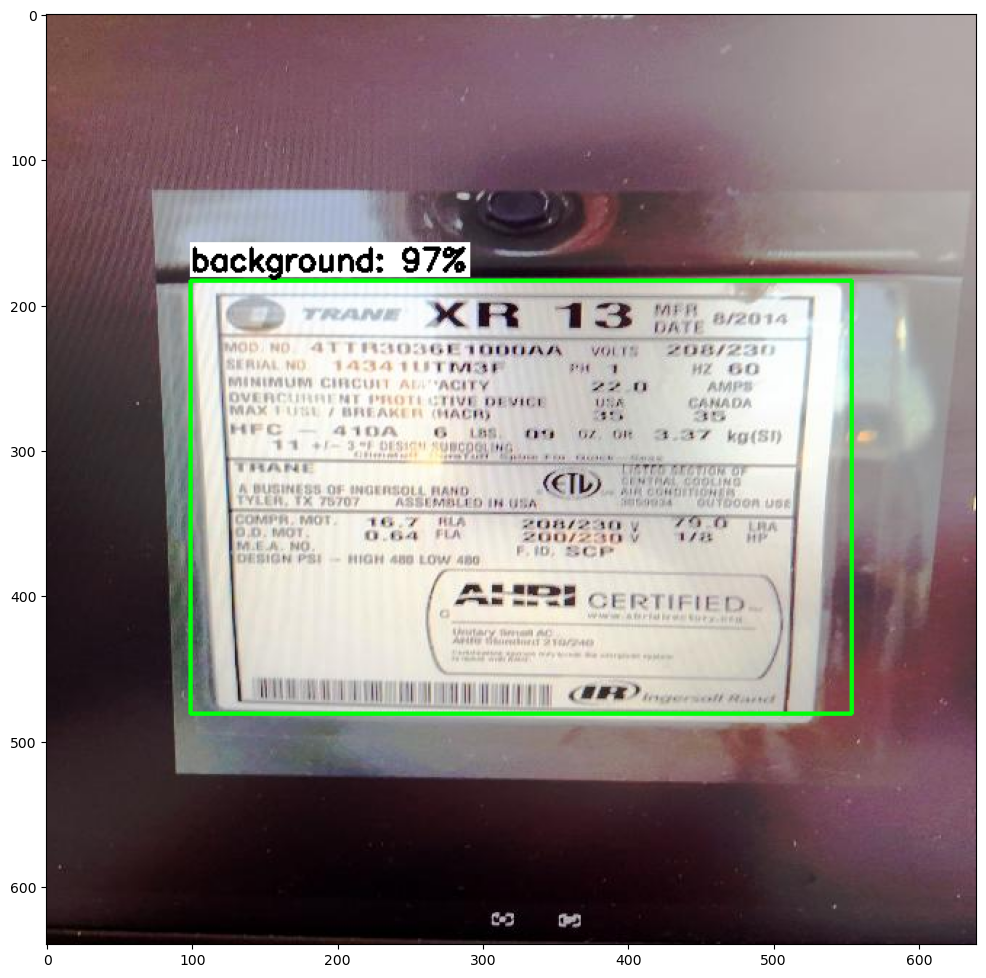

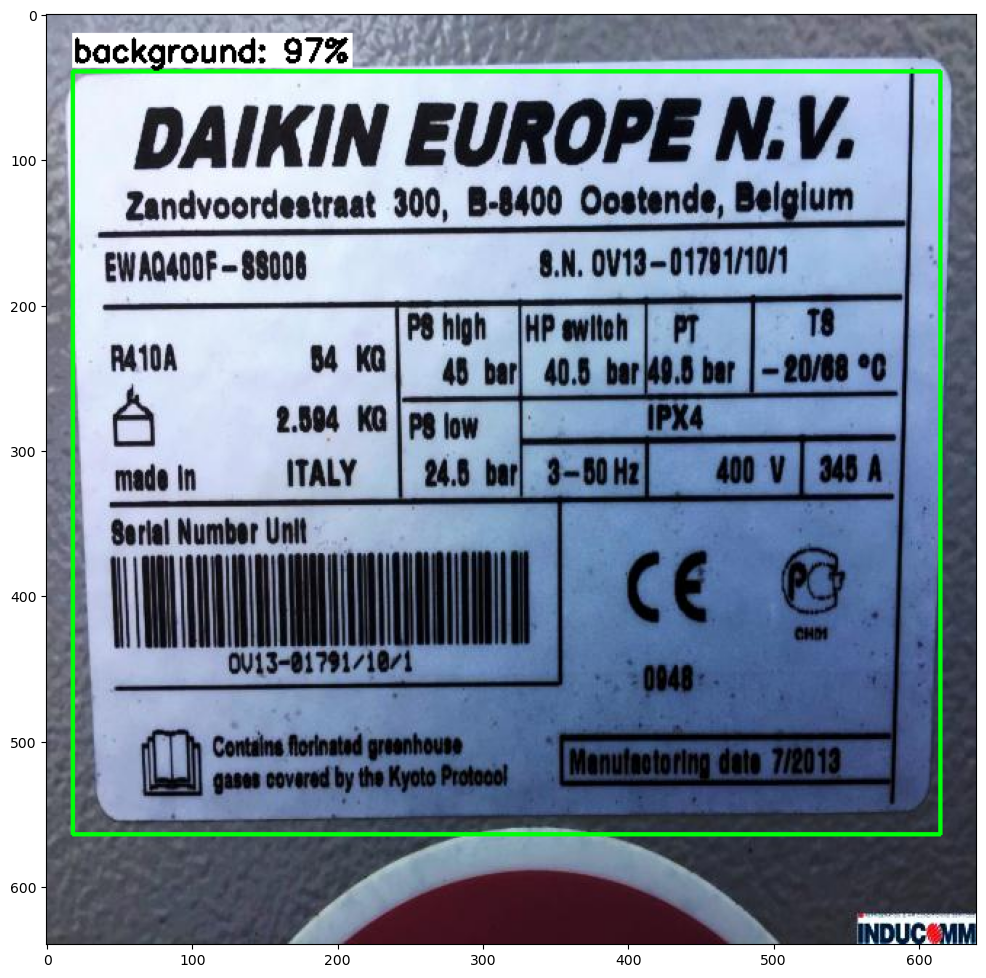

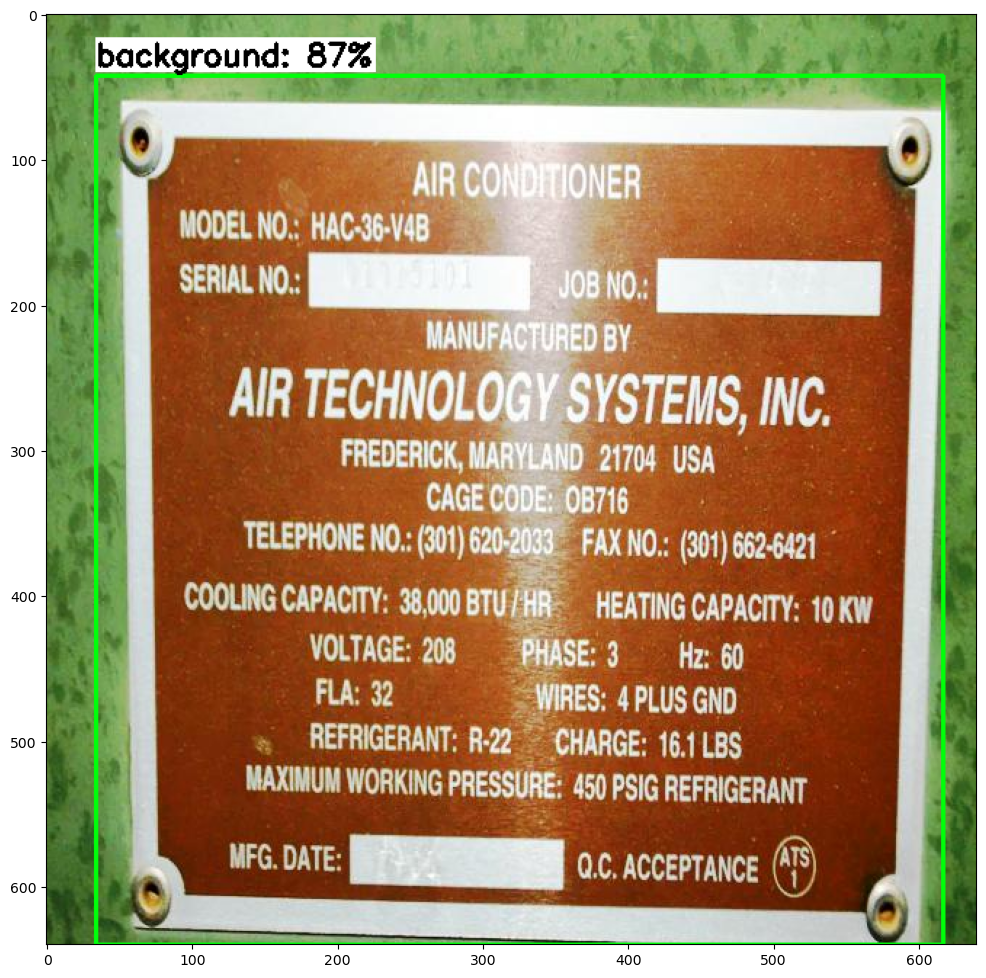

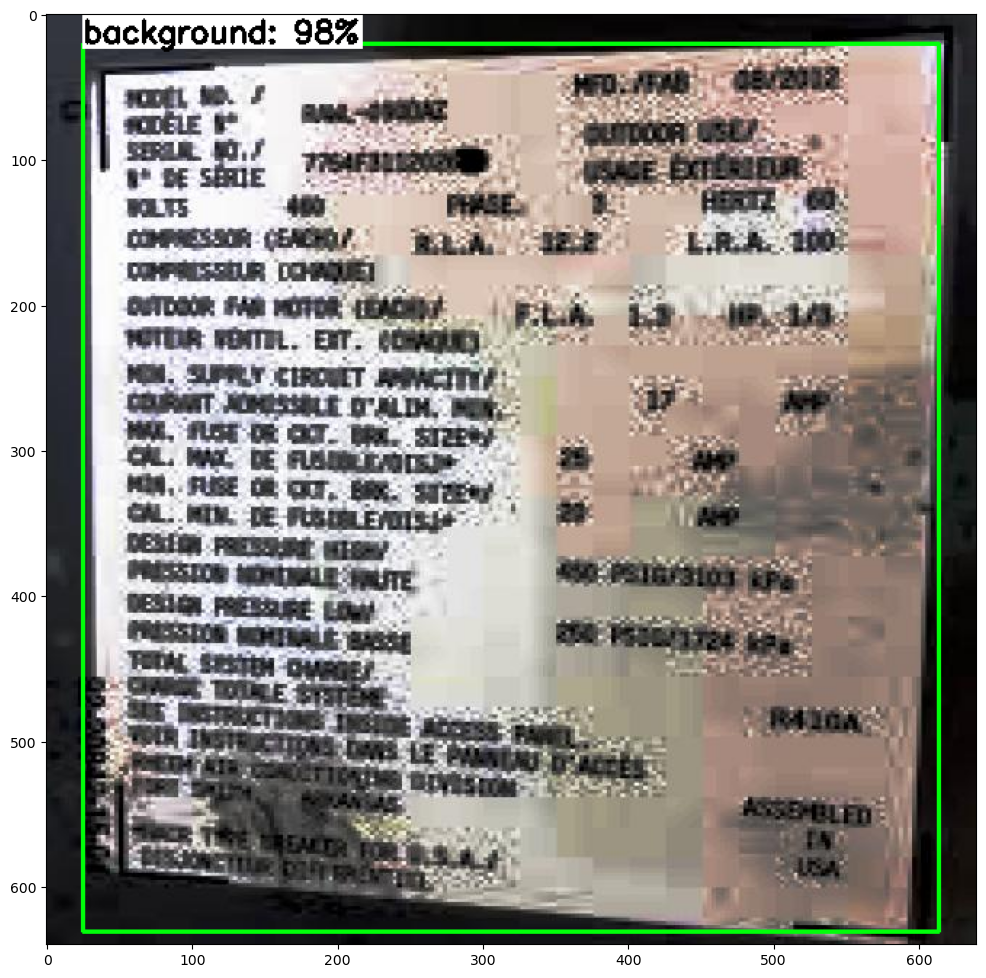

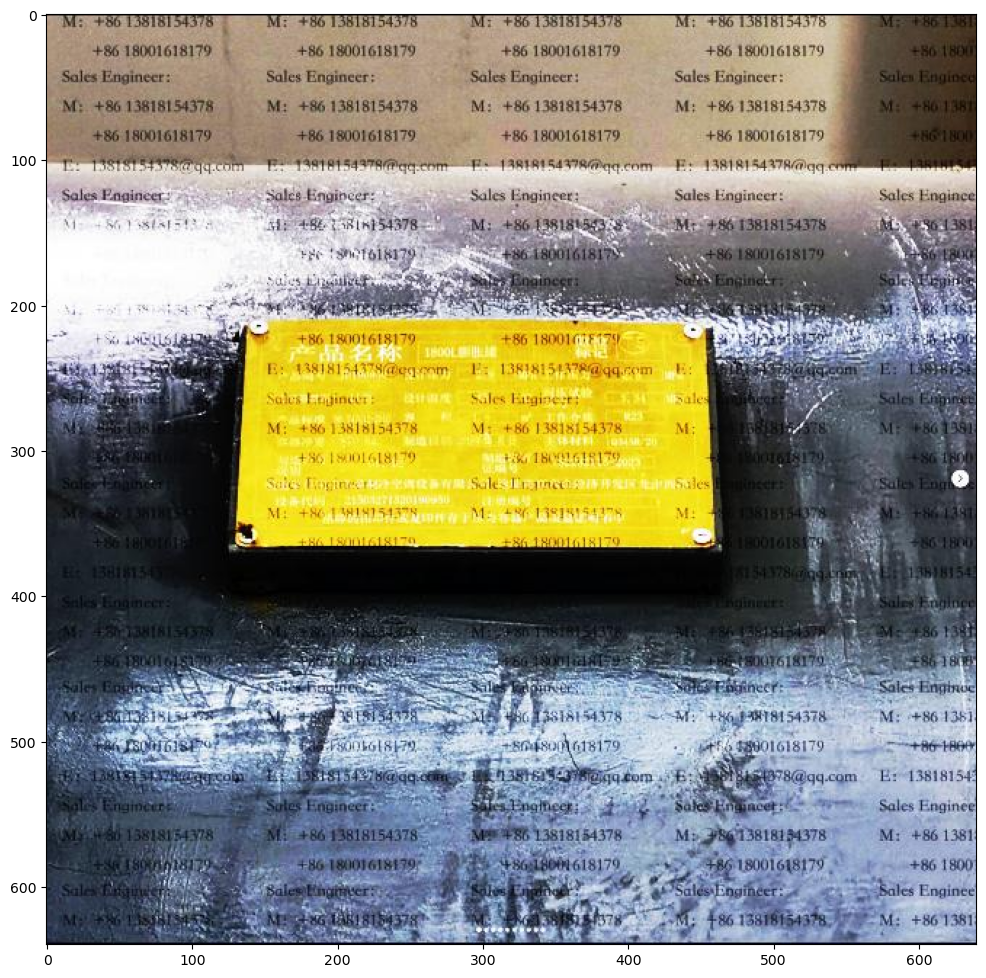

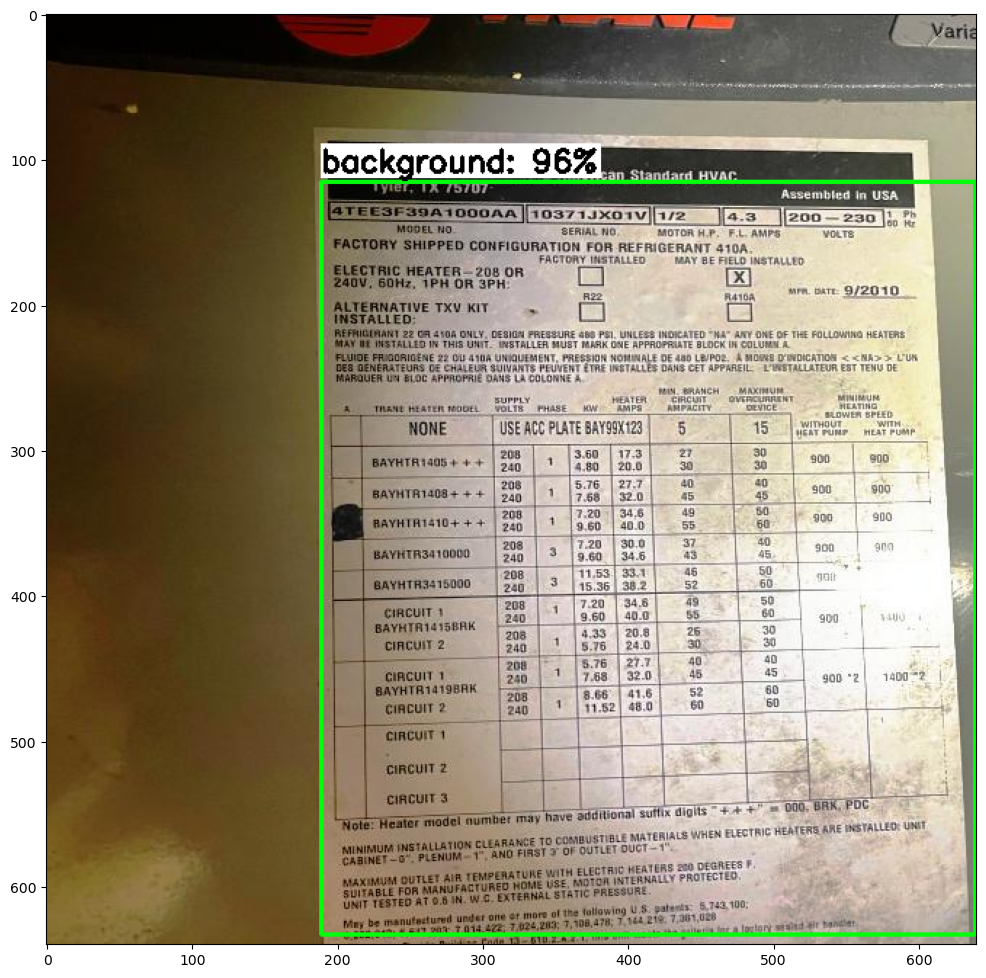

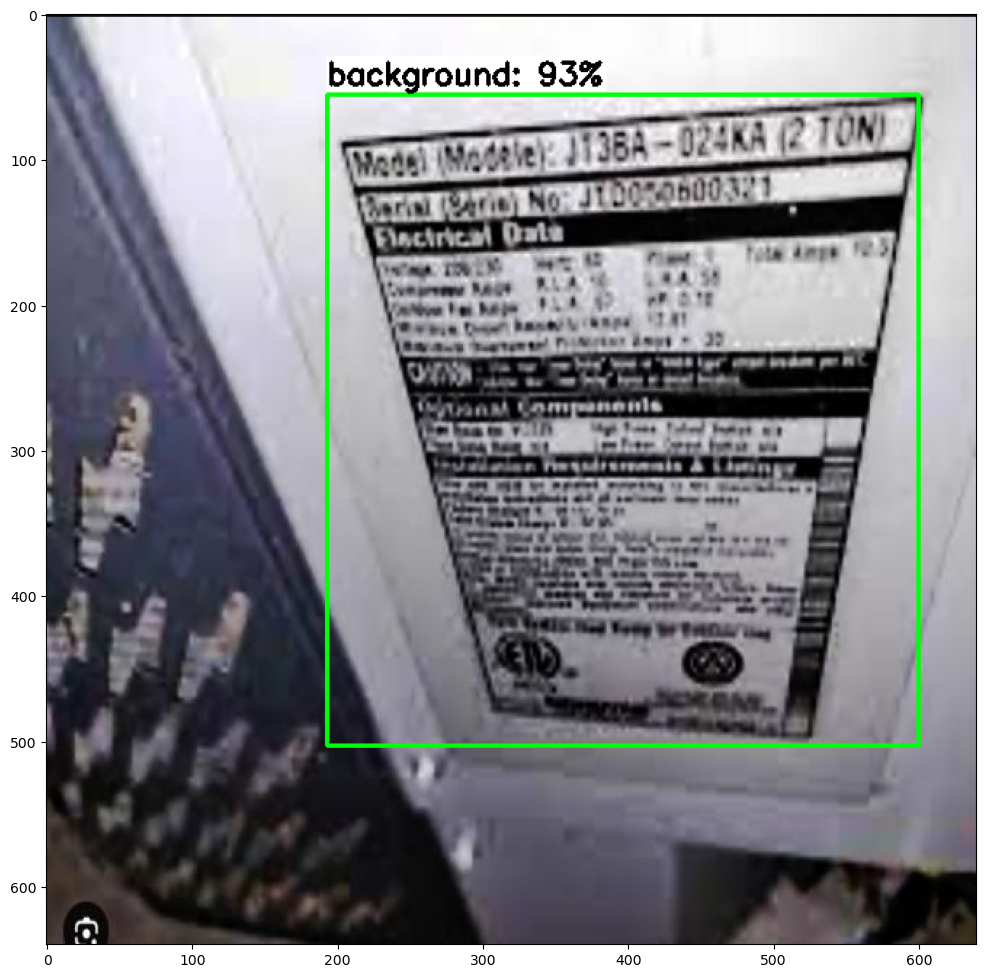

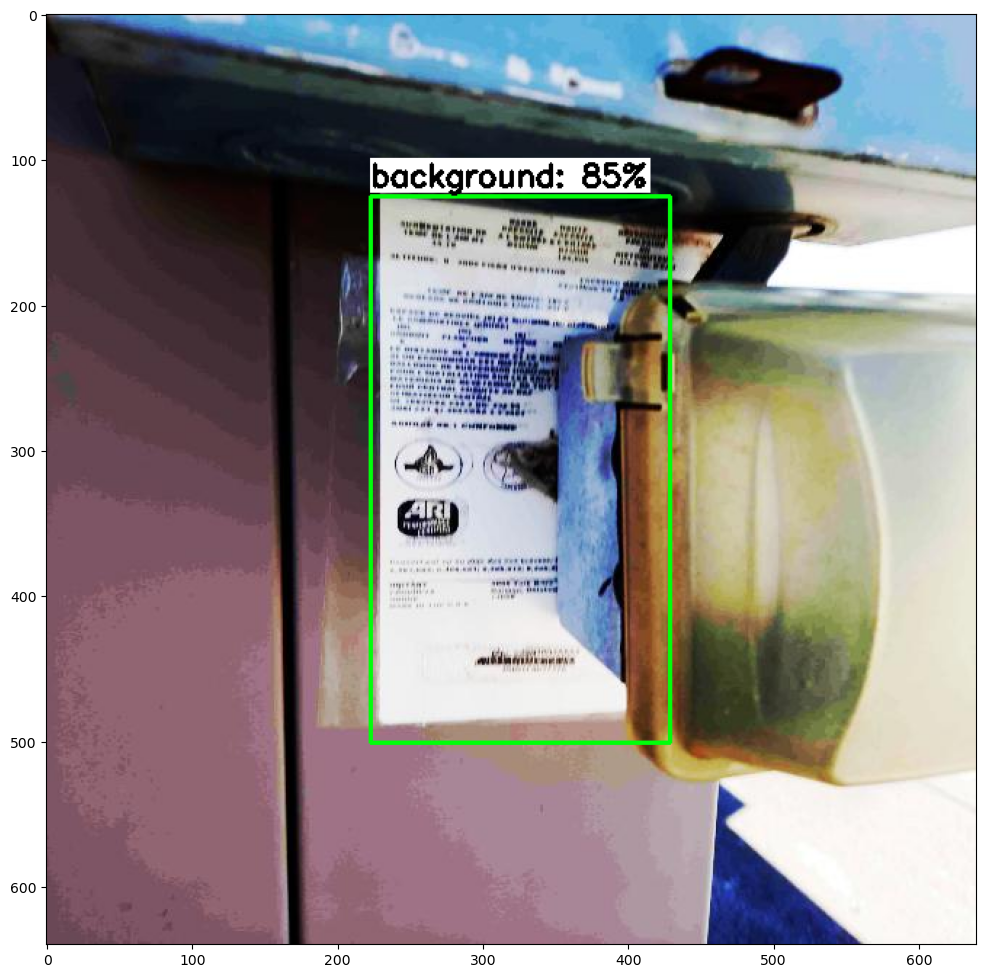

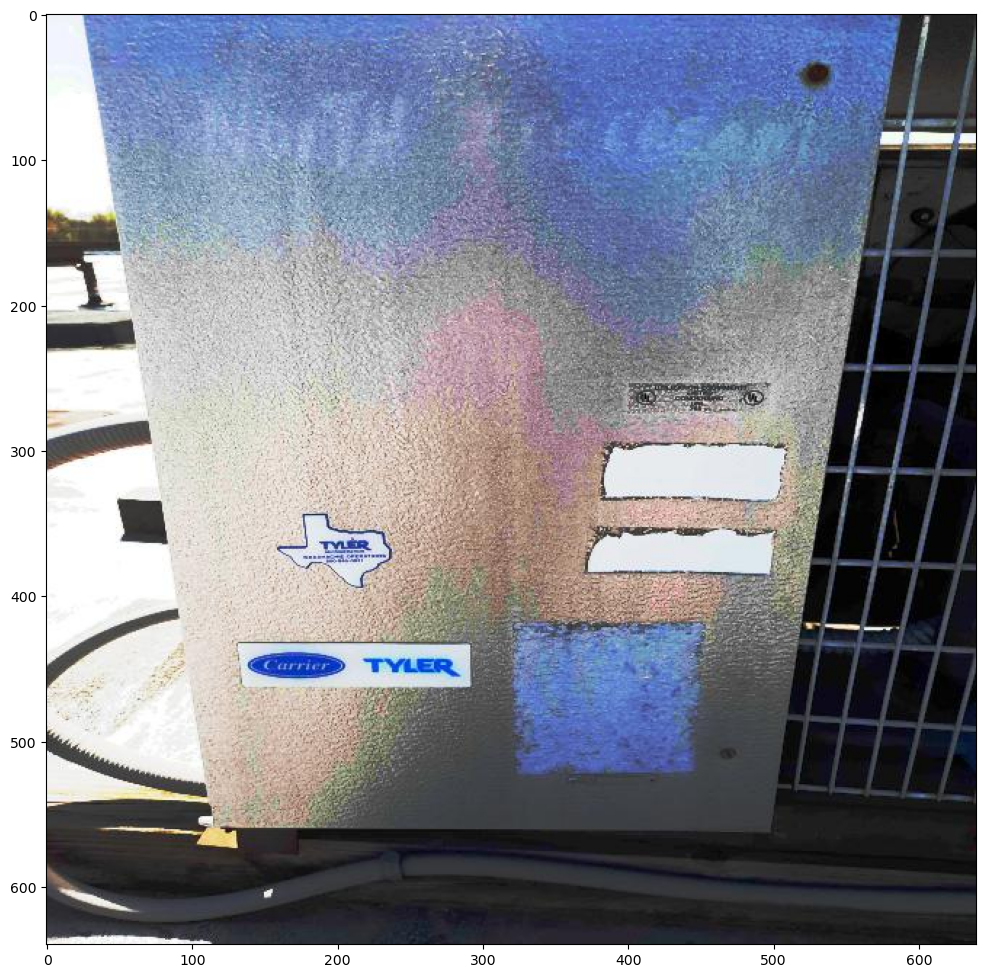

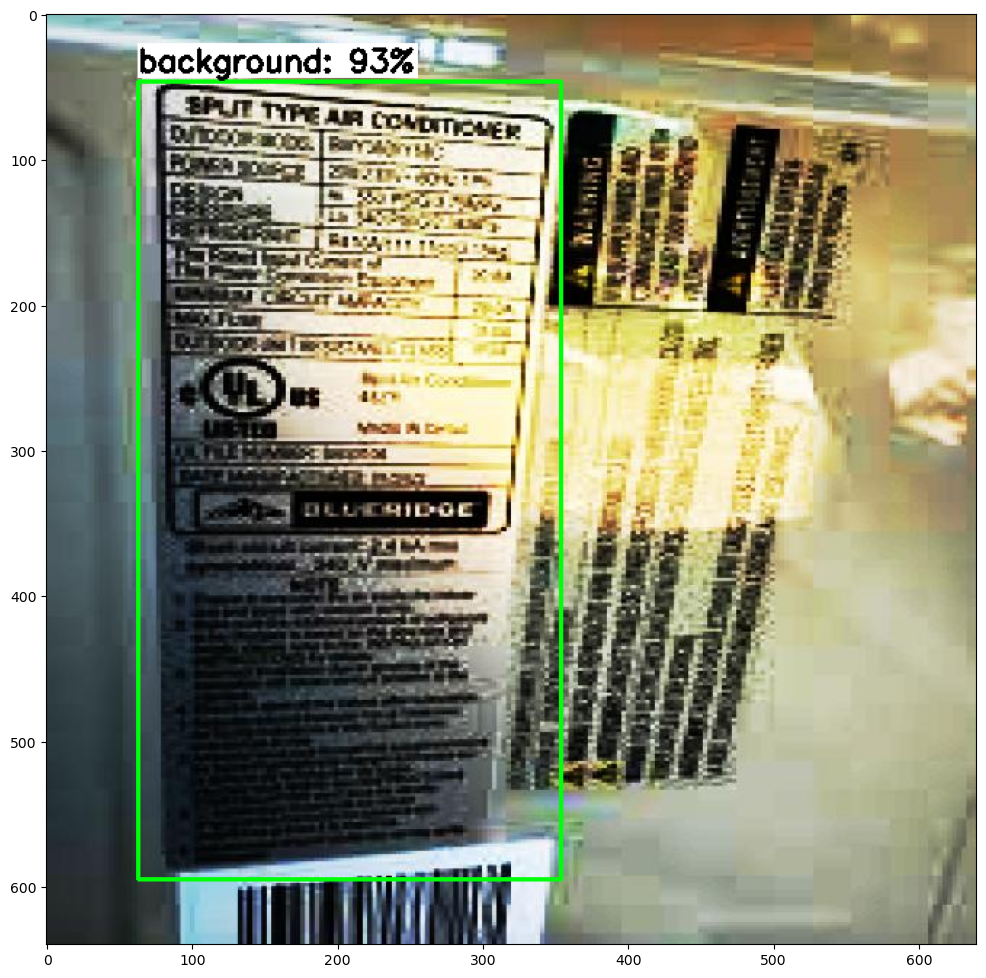

In [14]:
# Cell for Quantizing the TFLite Model
# Adapted from the provided sample code to fit this notebook's paths

import os
import glob
import random
import tensorflow as tf
from tensorflow.lite.python.interpreter import Interpreter

# Set matplotlib backend for inline display in notebook
import matplotlib
matplotlib.use('module://matplotlib_inline.backend_inline')
import matplotlib.pyplot as plt

# Paths (adjust if needed)
MODEL_DIR = '/home/manu/chamba/training/my_models'
OUTPUT_DIR = os.path.join(MODEL_DIR, 'exported_model')  # Saved model directory
QUANT_MODEL_PATH = os.path.join(MODEL_DIR, 'model_quant.tflite')  # Output quantized model path
TRAIN_IMAGE_PATH = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/train'  # Train images for representative dataset

# Get list of all images in train directory
jpg_file_list = glob.glob(TRAIN_IMAGE_PATH + '/*.jpg')
JPG_file_list = glob.glob(TRAIN_IMAGE_PATH + '/*.JPG')
png_file_list = glob.glob(TRAIN_IMAGE_PATH + '/*.png')
bmp_file_list = glob.glob(TRAIN_IMAGE_PATH + '/*.bmp')

quant_image_list = jpg_file_list + JPG_file_list + png_file_list + bmp_file_list

# First, get input details for model so we know how to preprocess images
interpreter = Interpreter(model_path=os.path.join(MODEL_DIR, 'model.tflite'))  # Original TFLite model
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
height = input_details[0]['shape'][1]
width = input_details[0]['shape'][2]

def representative_data_gen():
    dataset_list = quant_image_list
    quant_num = 300  # Number of samples for quantization
    for i in range(quant_num):
        pick_me = random.choice(dataset_list)
        image = tf.io.read_file(pick_me)

        if pick_me.endswith('.jpg') or pick_me.endswith('.JPG'):
            image = tf.io.decode_jpeg(image, channels=3)
        elif pick_me.endswith('.png'):
            image = tf.io.decode_png(image, channels=3)
        elif pick_me.endswith('.bmp'):
            image = tf.io.decode_bmp(image, channels=3)

        image = tf.image.resize(image, [width, height])
        image = tf.cast(image / 255., tf.float32)
        image = tf.expand_dims(image, 0)
        yield [image]

# Initialize converter from saved model
converter = tf.lite.TFLiteConverter.from_saved_model(os.path.join(OUTPUT_DIR, 'saved_model'))

# Enable quantization
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset = representative_data_gen
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
converter.target_spec.supported_types = [tf.int8]
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.float32

# Convert and save quantized model
tflite_model_quant = converter.convert()
with open(QUANT_MODEL_PATH, 'wb') as f:
    f.write(tflite_model_quant)

print(f"Quantized model saved to: {QUANT_MODEL_PATH}")

# Test the quantized model
PATH_TO_IMAGES = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/test'   # Path to test images folder
PATH_TO_MODEL = QUANT_MODEL_PATH   # Path to quantized .tflite model file
PATH_TO_LABELS = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/label_map.pbtxt'   # Path to labelmap.pbtxt file
min_conf_threshold = 0.5   # Confidence threshold
images_to_test = 10   # Number of images to run detection on

# Run inferencing function on quantized model
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

## Compare float31 vs int8

In [17]:
# Cell to Compare Raw TFLite vs Quantized Model

import os
import cv2
import numpy as np
import glob
import random
import time
import tensorflow as tf

# Paths to models
RAW_MODEL_PATH = '/home/manu/chamba/training/my_models/model.tflite'
QUANT_MODEL_PATH = '/home/manu/chamba/training/my_models/model_quant.tflite'

# Path to test images
PATH_TO_IMAGES = '/home/manu/chamba/training/ai-hvac-nameplate-focus-12/test'

# Number of inferences to average
num_inferences = 20

# Function to get model info
def get_model_info(model_path):
    # File size
    size_bytes = os.path.getsize(model_path)
    size_mb = size_bytes / (1024 * 1024)
    
    # Load interpreter
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    
    return {
        'size_bytes': size_bytes,
        'size_mb': round(size_mb, 2),
        'input_details': input_details,
        'output_details': output_details
    }

# Function to measure average inference time and collect confidences
def measure_inference_time_and_confidence(model_path, image_paths):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()
    height = input_details[0]['shape'][1]
    width = input_details[0]['shape'][2]
    float_input = (input_details[0]['dtype'] == np.float32)
    input_mean = 127.5
    input_std = 127.5

    times = []
    all_confidences = []
    num_detections = 0
    for image_path in image_paths:
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image_rgb, (width, height))
        input_data = np.expand_dims(image_resized, axis=0)
        if float_input:
            input_data = (np.float32(input_data) - input_mean) / input_std

        start_time = time.perf_counter()
        interpreter.set_tensor(input_details[0]['index'], input_data)
        interpreter.invoke()
        # Retrieve outputs
        scores = interpreter.get_tensor(output_details[0]['index'])[0]
        end_time = time.perf_counter()
        times.append(end_time - start_time)

        # Collect confidences above 0.5
        confidences = [score for score in scores if score > 0.5]
        all_confidences.extend(confidences)
        num_detections += len(confidences)

    avg_time = sum(times) / len(times)
    avg_confidence = sum(all_confidences) / len(all_confidences) if all_confidences else 0
    return avg_time, avg_confidence, num_detections

# Get info for both models
raw_info = get_model_info(RAW_MODEL_PATH)
quant_info = get_model_info(QUANT_MODEL_PATH)

# Get list of images
images = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = random.sample(images, num_inferences)

# Measure times and confidences
raw_avg_time, raw_avg_conf, raw_num_det = measure_inference_time_and_confidence(RAW_MODEL_PATH, images_to_test)
quant_avg_time, quant_avg_conf, quant_num_det = measure_inference_time_and_confidence(QUANT_MODEL_PATH, images_to_test)

# Print comparison
print("=== Model Comparison: Raw TFLite vs Quantized TFLite ===\n")

print("Raw Model:")
print(f"  Size: {raw_info['size_bytes']} bytes ({raw_info['size_mb']} MB)")
print("  Input Details:")
for detail in raw_info['input_details']:
    print(f"    {detail}")
print("  Output Details:")
for detail in raw_info['output_details']:
    print(f"    {detail}")
print(f"  Average Inference Time: {raw_avg_time:.4f} seconds per image")
print(f"  Average Confidence (detections > 0.5): {raw_avg_conf:.4f}")
print(f"  Total Detections (above 0.5): {raw_num_det}")

print("\nQuantized Model:")
print(f"  Size: {quant_info['size_bytes']} bytes ({quant_info['size_mb']} MB)")
print("  Input Details:")
for detail in quant_info['input_details']:
    print(f"    {detail}")
print("  Output Details:")
for detail in quant_info['output_details']:
    print(f"    {detail}")
print(f"  Average Inference Time: {quant_avg_time:.4f} seconds per image")
print(f"  Average Confidence (detections > 0.5): {quant_avg_conf:.4f}")
print(f"  Total Detections (above 0.5): {quant_num_det}")

print(f"\nSize Reduction: {round(raw_info['size_mb'] - quant_info['size_mb'], 2)} MB ({round((1 - quant_info['size_mb']/raw_info['size_mb'])*100, 2)}% smaller)")
print(f"Speedup: {raw_avg_time / quant_avg_time:.2f}x faster")

=== Model Comparison: Raw TFLite vs Quantized TFLite ===

Raw Model:
  Size: 11497428 bytes (10.96 MB)
  Input Details:
    {'name': 'serving_default_input:0', 'index': 0, 'shape': array([  1, 320, 320,   3], dtype=int32), 'shape_signature': array([  1, 320, 320,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}
  Output Details:
    {'name': 'StatefulPartitionedCall:1', 'index': 339, 'shape': array([ 1, 10], dtype=int32), 'shape_signature': array([ 1, 10], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}
    {'name': 'StatefulPartitionedCall:3', 'index': 337, 'shape': array([ 1, 10,  4], dtype=int32), 'shape_signature': ar